## 1. Mounting the drive and loading necessary libraries



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import cv2
import matplotlib.pylab as plt
import numpy as np
import glob
import keras
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D, MaxPool2D, Concatenate, BatchNormalization, Input, Activation, UpSampling2D, Conv2DTranspose
from tensorflow.keras.utils import plot_model
from keras.losses import binary_crossentropy
from keras.models import  Model


## 2. Loading the dataset and visulization

In [ ]:
image_path = '/content/drive/MyDrive/dida test task/dida_test_task/images/*.png'
image_ids = sorted(glob.glob(image_path)) # the path directory has been sorted to make sure the image and label are in correct pair

images = [cv2.imread(image, 1)/255 for image in image_ids]
images = np.array(images)

# Dividing the 30 images in test and train
train_images = images[:25]
test_images = images[25:]

print('Shape of train images dataset{0} \Shape of test images dataset{1} '.format(train_images.shape, test_images.shape))

Shape of train images dataset(25, 256, 256, 3) \Shape of test images dataset(5, 256, 256, 3) 


In [ ]:
labels_path = '/content/drive/MyDrive/dida test task/dida_test_task/labels/*.png'
label_ids = sorted( glob.glob(labels_path)) # the path directory has been sorted to make sure the image and label are in correct pair

labels = [cv2.imread(label, 1)/255 for label in label_ids ]
labels = np.array(labels)
print('Shape of labels ' , labels.shape)

Shape of labels  (25, 256, 256, 3)


In [ ]:
# Visulizing the image and label in pair to make sure they have been loaded in correct order

def plotting_pair(images, labels): # defining as a function so that we can use it repeatably
  for i in range(len(labels)):
    fig, ax = plt.subplots(1,2, figsize = (12, 6))
    ax[0].imshow(images[i])
    ax[1].imshow(labels[i], cmap = 'gray')
    plt.show()

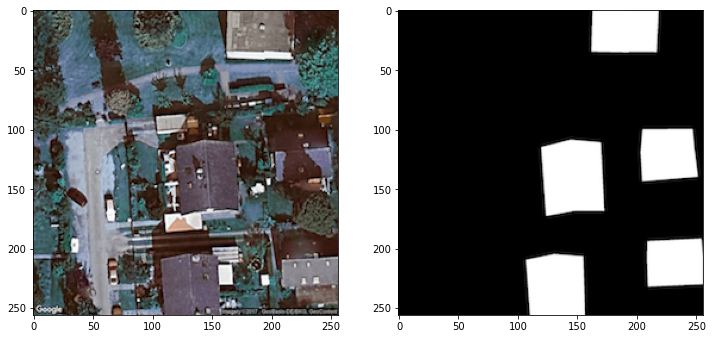

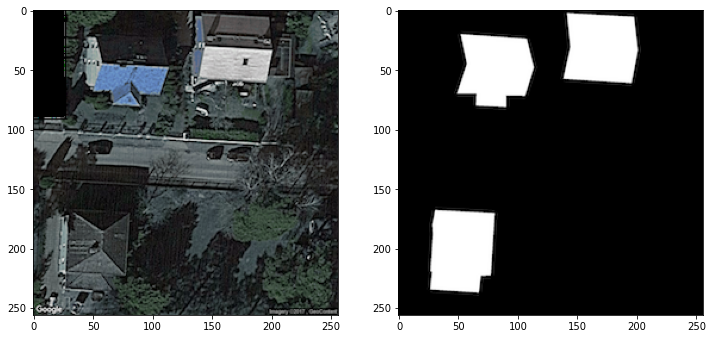

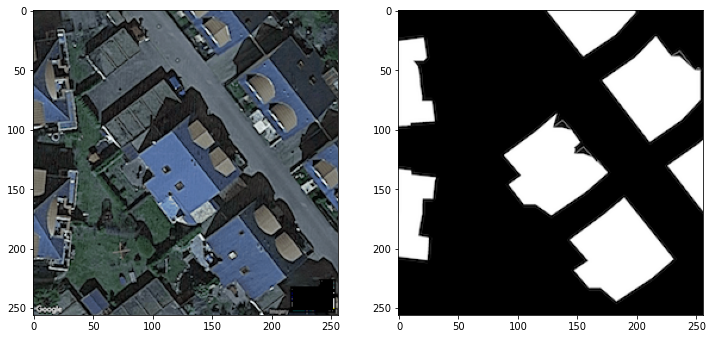

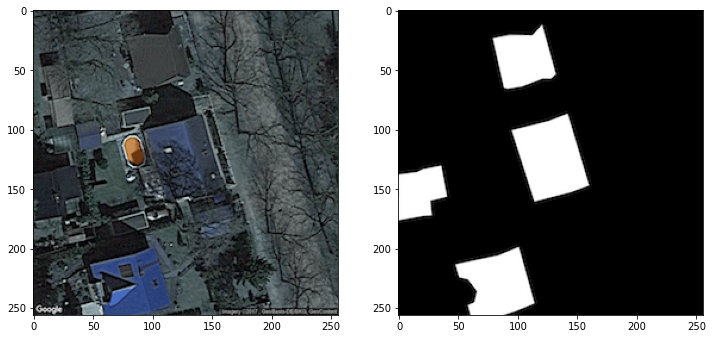

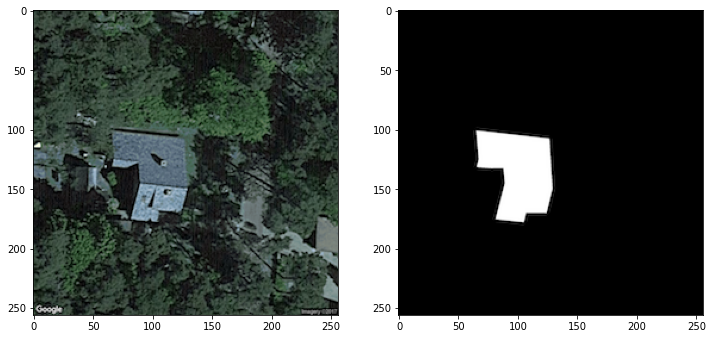

...

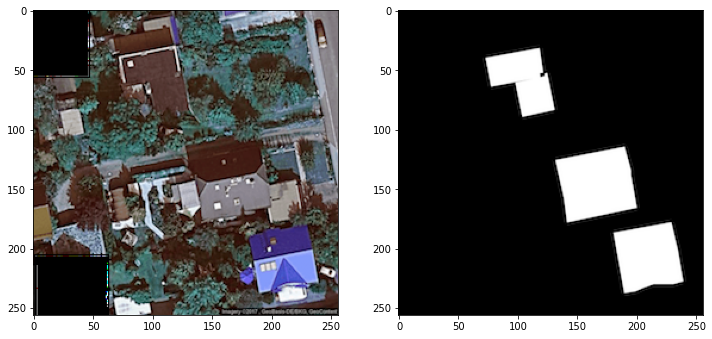

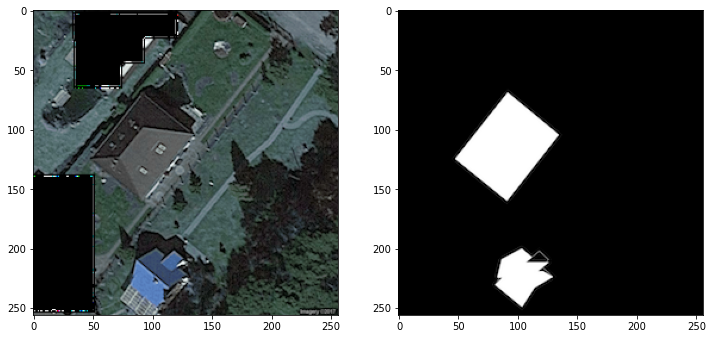

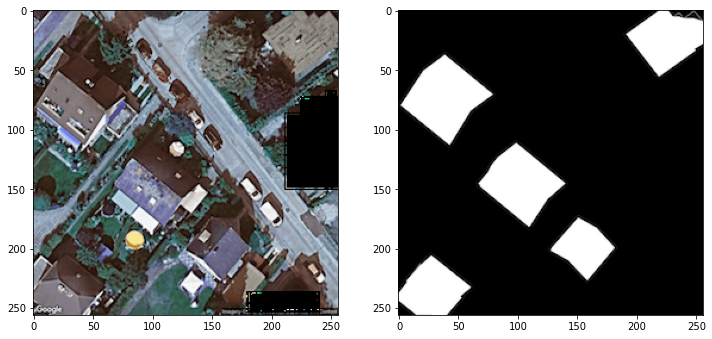

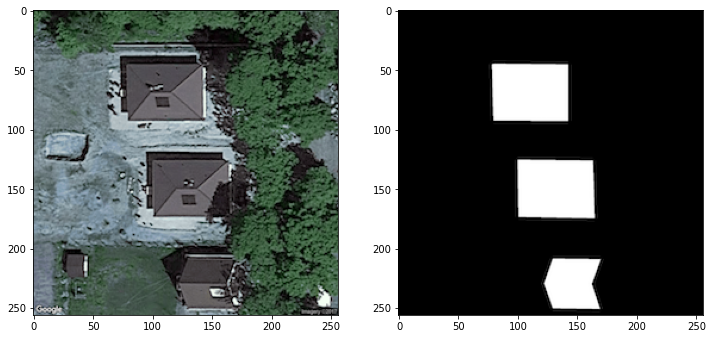

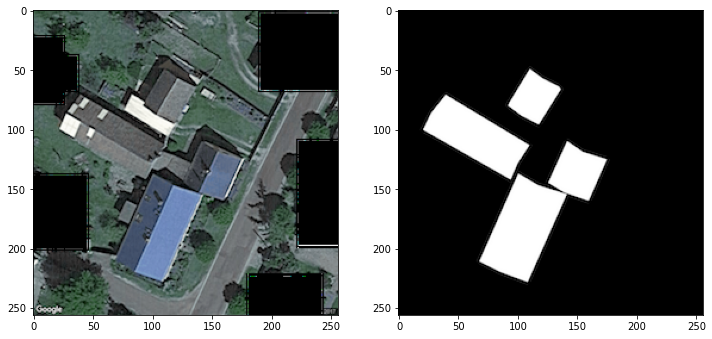

In [ ]:
plotting_pair(train_images, labels)

## 3. Model

## 3.1 Creating U-net model
U-net architecture is very popular choice for semantic segmentation of images. 

In [ ]:
def convolution_layer(input, number_filters):
  x = Conv2D(number_filters, 3, kernel_initializer = 'he_normal', padding='same')(input)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)

  x = Conv2D(number_filters, 3,kernel_initializer = 'he_normal', padding='same')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  return x

def encoder_layer(input, number_filters):
  x = convolution_layer(input, number_filters)
  p = MaxPool2D((2,2))(x)
  return x, p  # x is also returned to use it later for concatenation of u-net

def decoder_layer(input, concatenate_layer, number_filters):
  x = Conv2DTranspose(number_filters, (2,2), strides=2, padding = 'same')(input)
  x = Concatenate()([x, concatenate_layer])
  x = convolution_layer(x, number_filters)
  return x

def unet_model(input_shape):
  inputs = Input(shape = input_shape)

  x1, p1 = encoder_layer(inputs, 16)
  x2, p2 = encoder_layer(p1,32)
  x3, p3 = encoder_layer(p2,64)
  x4, p4 = encoder_layer(p3,128)

  base = convolution_layer(p4, 256) 

  d1 = decoder_layer(base, x4, 128)
  d2 = decoder_layer(d1, x3, 64)
  d3 = decoder_layer(d2, x2, 32)
  d4 = decoder_layer(d3, x1, 16)

  outputs = Conv2D(3, 1, padding = 'same', activation = 'sigmoid')(d4)

  model = Model(inputs, outputs, name = 'Unet')
  return model
                     

In [ ]:
input_shape = (256, 256, 3)
model = unet_model(input_shape)
model.compile(Adam(learning_rate=0.001) ,metrics=["accuracy"], loss = 'binary_crossentropy')
model.summary()

In [ ]:
history = model.fit (train_images, labels, batch_size=5, epochs= 200)
             

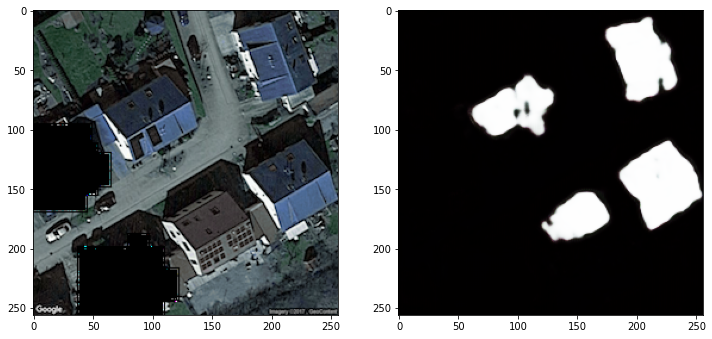

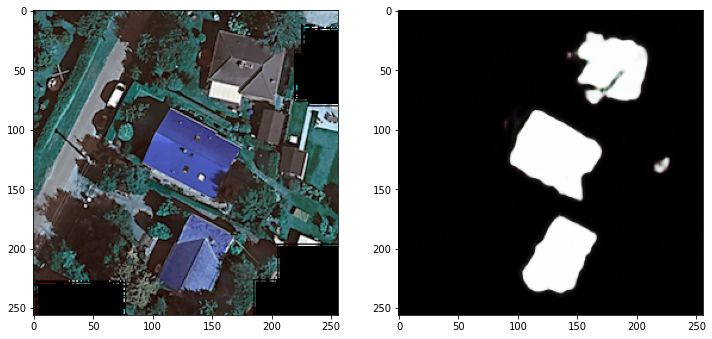

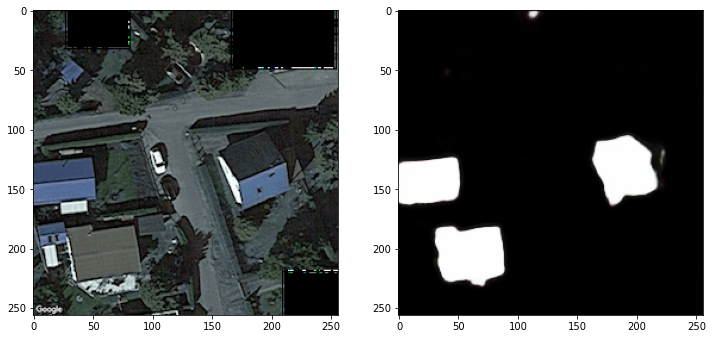

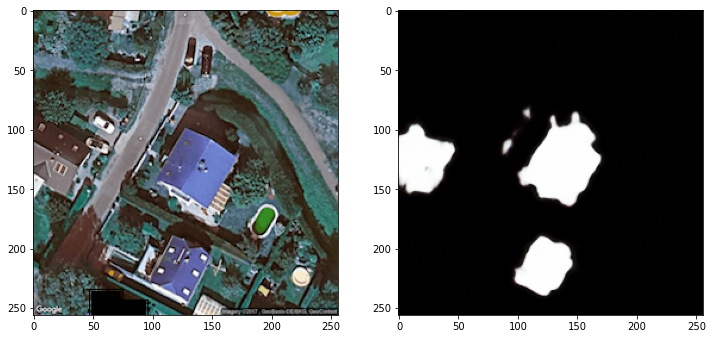

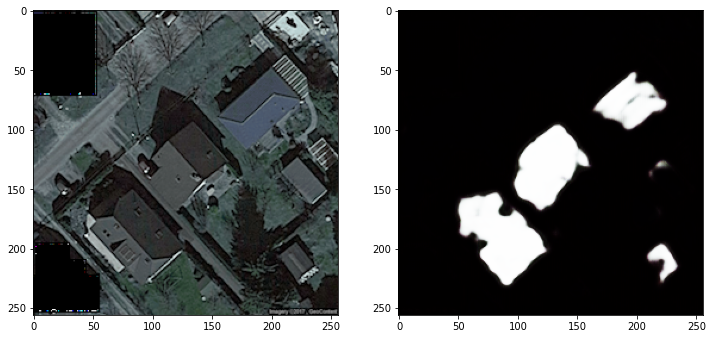

In [ ]:
predicted_labels = model.predict(test_images)
plotting_pair(test_images, predicted_labels)

The prediction results are not that crisp. However, the model has been trained with only 25 images. There is always chance of having better result with the same model if plenty of data is provided.  

## 3.2 Using pretrained model from the library


In [ ]:
pip install segmentation-models

In [ ]:
import segmentation_models as sm
sm.set_framework('tf.keras')
sm.framework()

BACKBONE = 'resnet34'
preprocess_input = sm.get_preprocessing(BACKBONE)

pretrained_model = sm.Unet(BACKBONE, encoder_weights='imagenet')
pretrained_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
pretrained_model.summary()

In [ ]:
# for the pretrained model the output dimension is 256*256*1 
pre_labels = [cv2.imread(label, 0)/255 for label in label_ids ]
pre_labels = np.array(pre_labels)
pre_labels_expand = np.expand_dims(pre_labels, axis=3)
pre_labels_expand.shape

(25, 256, 256, 1)

In [ ]:
pretrained_history = pretrained_model.fit(train_images, pre_labels_expand, batch_size=5, epochs= 100) 

Epoch 1/150
5/5 [==============================] - 1s 272ms/step - loss: 0.2863 - accuracy: 0.8767
Epoch 2/150
5/5 [==============================] - 1s 262ms/step - loss: 0.2373 - accuracy: 0.8913
Epoch 3/150
5/5 [==============================] - 1s 265ms/step - loss: 0.1976 - accuracy: 0.9066
Epoch 4/150
5/5 [==============================] - 1s 264ms/step - loss: 0.1622 - accuracy: 0.9155
Epoch 5/150
5/5 [==============================] - 1s 264ms/step - loss: 0.1422 - accuracy: 0.9237
Epoch 6/150
5/5 [==============================] - 1s 266ms/step - loss: 0.1246 - accuracy: 0.9274
Epoch 7/150
5/5 [==============================] - 1s 264ms/step - loss: 0.1171 - accuracy: 0.9314
Epoch 8/150
5/5 [==============================] - 1s 264ms/step - loss: 0.1089 - accuracy: 0.9336
Epoch 9/150
5/5 [==============================] - 1s 262ms/step - loss: 0.0970 - accuracy: 0.9379
Epoch 10/150
5/5 [==============================] - 1s 266ms/step - loss: 0.0893 - accuracy: 0.9391
Epoch 11/

In [ ]:
pretrained_predict_lb = pretrained_model(test_images)
pretrained_predict_lb = np.array(pretrained_predict_lb)
pretrained_predict_lb = pretrained_predict_lb.reshape((5, 256, 256))
pretrained_predict_lb.shape

(5, 256, 256)

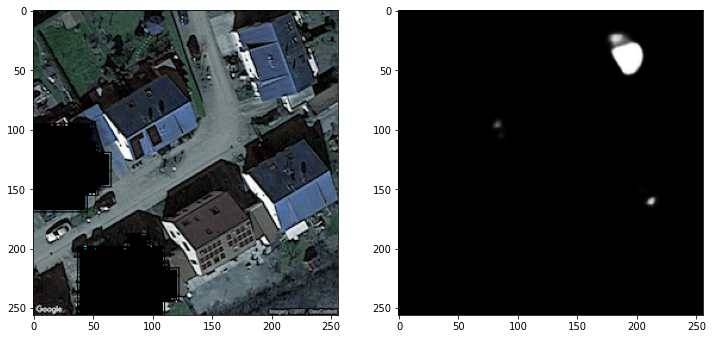

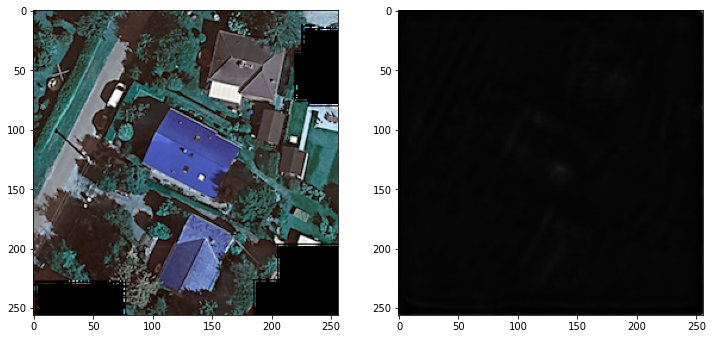

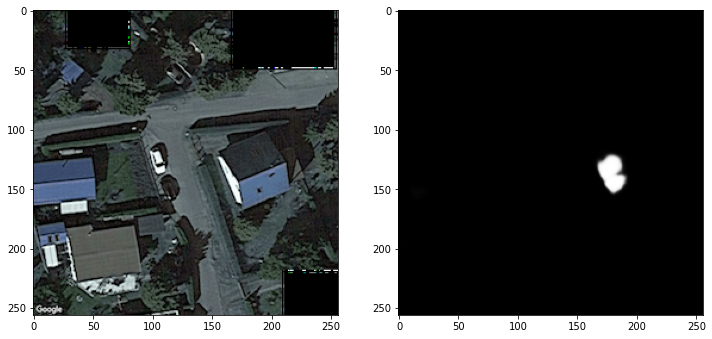

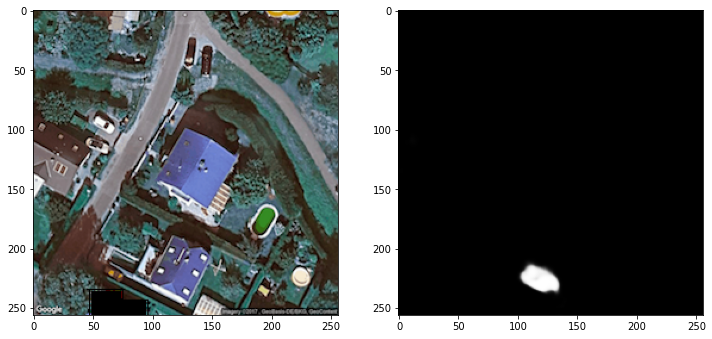

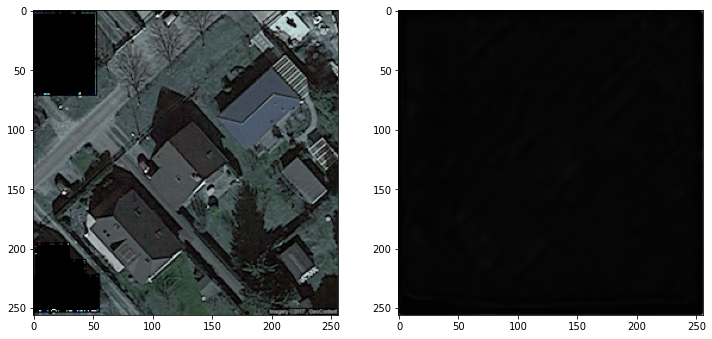

In [ ]:
# visualization of the prediction
plotting_pair(test_images,pretrained_predict_lb)

## 4. Data Augmentation
Data augmentation is a process where new data are created from the originial data by various method such as rotation, shearing, horizontal flip, vertical flip etc. As the given dataset is very small, using data augmentation, 1000 new images has been created to train the U-net model and pretrained model with bigger dataset. 

In [ ]:
import albumentations as A
from skimage import io, img_as_ubyte
import random
images_to_generate=1000

In [ ]:
aug_img_path = '/content/drive/MyDrive/dida test task/dida_test_task/augmented_images'
aug_lab_path = '/content/drive/MyDrive/dida test task/dida_test_task/augmented_labels'


aug = A.Compose([
    A.VerticalFlip(p=0.5),              
    A.RandomRotate90(p=0.5),
    A.HorizontalFlip(p=1),
    A.Transpose(p=1),
    #A.ElasticTransform(p=1, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),
    A.GridDistortion(p=1)
    ]
)

i=1   # variable to iterate till images_to_generate


while i<=images_to_generate: 
    number = random.randint(0, len(train_images)-1)  #PIck a number to select an image & mask
    original_image = train_images[number]
    original_mask = labels[number]

    
    augmented = aug(image=original_image, mask=original_mask)
    transformed_image = augmented['image']
    transformed_mask = augmented['mask']

        
    new_image_path= "%s/augmented_image_%s.png" %(aug_img_path, i)
    new_mask_path = "%s/augmented_mask_%s.png" %(aug_lab_path, i)
    io.imsave(new_image_path, transformed_image)
    io.imsave(new_mask_path, transformed_mask)
    i =i+1

In [ ]:
# Loading the augmented images
aug_image_path = '/content/drive/MyDrive/dida test task/dida_test_task/augmented_images/*.png'
aug_image_ids = sorted(glob.glob(aug_image_path))


aug_train_images = [cv2.imread(image, 1)/255 for image in aug_image_ids]
aug_train_images = np.array(aug_train_images)
aug_train_images.shape

(1000, 256, 256, 3)

In [ ]:
# Loading the augmented labels
aug_labels_path = '/content/drive/MyDrive/dida test task/dida_test_task/augmented_labels/*.png'
aug_label_ids = sorted( glob.glob(aug_labels_path))


aug_labels = [cv2.imread(label, 1)/255 for label in aug_label_ids ]
aug_labels = np.array(aug_labels)
aug_labels.shape

(1000, 256, 256, 3)

## 4.1 Training U-net model with augmented dataset

In [ ]:
input_shape = (256, 256, 3)
model2 = unet_model(input_shape)
model2.compile(Adam(learning_rate=0.001) ,metrics=['accuracy'], loss = 'binary_crossentropy')
aug_history = model2.fit (aug_train_images, aug_labels, batch_size=32, epochs= 100, validation_split= 0.1)

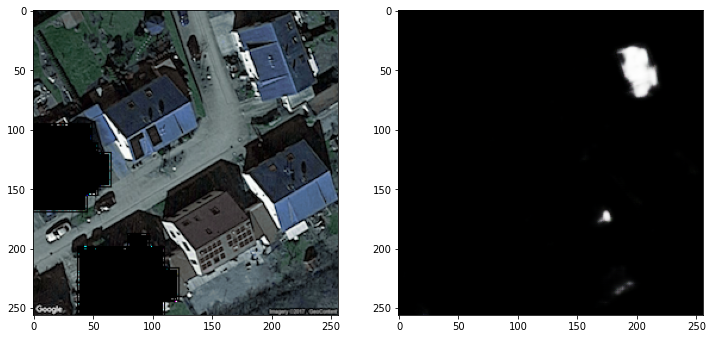

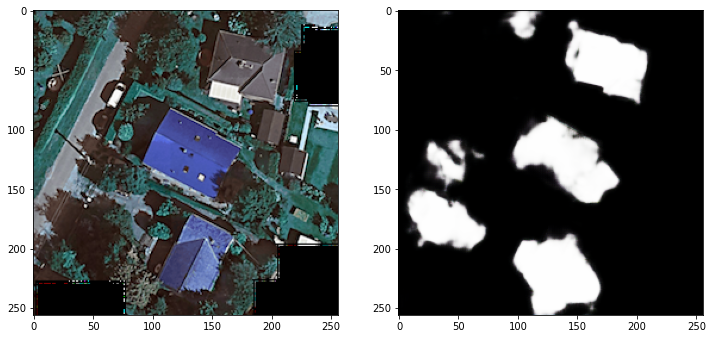

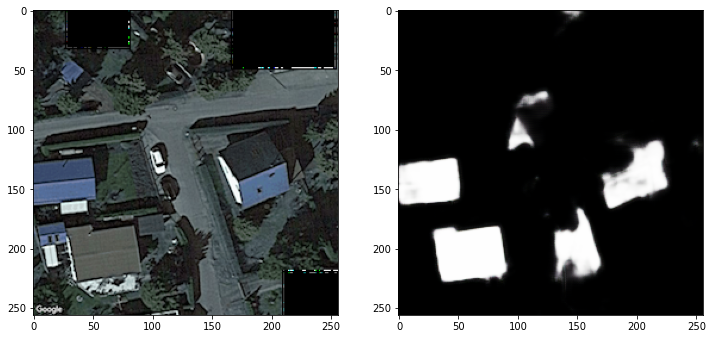

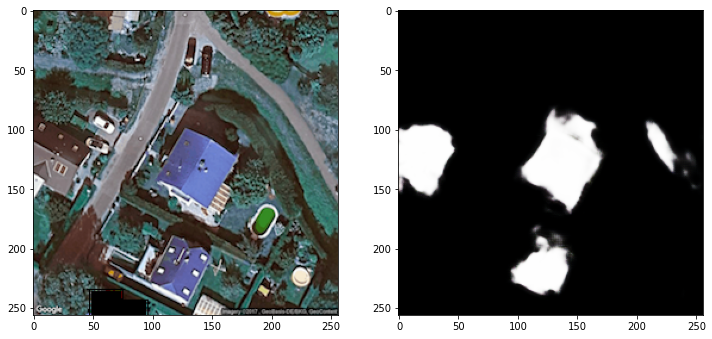

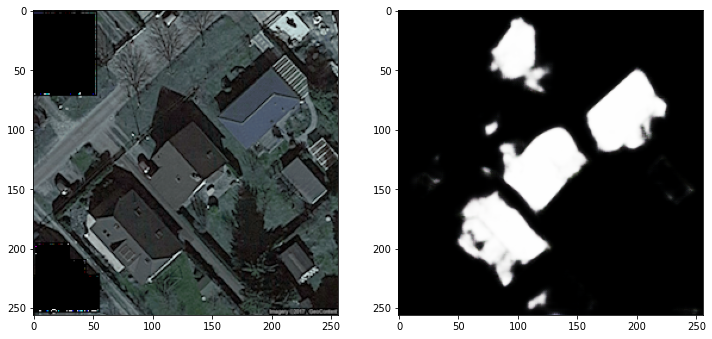

In [ ]:
# visualization of the prediction
aug_predict = model2.predict(test_images)
plotting_pair(test_images, aug_predict)

## 4.2 Training Pretrained model with augmented dataset

In [ ]:
# for the pretrained model, the dimension of output is 256*256*1
pre_aug_labels = [cv2.imread(label, 0)/255 for label in aug_label_ids ] 
pre_aug_labels = np.array(pre_aug_labels)
pre_aug_labels.shape
pre_aug_labels_expand = np.expand_dims(pre_aug_labels, axis=3)
pre_aug_labels_expand.shape

(1000, 256, 256, 1)

In [ ]:
pretrained_model2 = sm.Unet(BACKBONE, encoder_weights='imagenet')
pretrained_model2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
aug_pretrain_history = pretrained_model2.fit(aug_train_images, pre_aug_labels_expand,batch_size=32, epochs= 100, validation_split= 0.1 )

Epoch 1/100
29/29 [==============================] - 41s 1s/step - loss: 0.3002 - accuracy: 0.8732 - val_loss: 1.3332 - val_accuracy: 0.7275
Epoch 2/100
29/29 [==============================] - 27s 948ms/step - loss: 0.1266 - accuracy: 0.9295 - val_loss: 0.5369 - val_accuracy: 0.8249
Epoch 3/100
29/29 [==============================] - 27s 945ms/step - loss: 0.0992 - accuracy: 0.9357 - val_loss: 0.5433 - val_accuracy: 0.8249
Epoch 4/100
29/29 [==============================] - 27s 945ms/step - loss: 0.0794 - accuracy: 0.9400 - val_loss: 0.4196 - val_accuracy: 0.8249
Epoch 5/100
29/29 [==============================] - 27s 945ms/step - loss: 0.0670 - accuracy: 0.9440 - val_loss: 0.6793 - val_accuracy: 0.8249
Epoch 6/100
29/29 [==============================] - 27s 945ms/step - loss: 0.0552 - accuracy: 0.9470 - val_loss: 0.7575 - val_accuracy: 0.8249
Epoch 7/100
29/29 [==============================] - 27s 945ms/step - loss: 0.0465 - accuracy: 0.9499 - val_loss: 0.8195 - val_accuracy: 0.

In [ ]:
prediction_aug_pretrain = pretrained_model2.predict(test_images)
prediction_aug_pretrain = np.array(prediction_aug_pretrain)

prediction_aug_pretrain = prediction_aug_pretrain.reshape((5, 256, 256))
prediction_aug_pretrain.shape

(5, 256, 256)

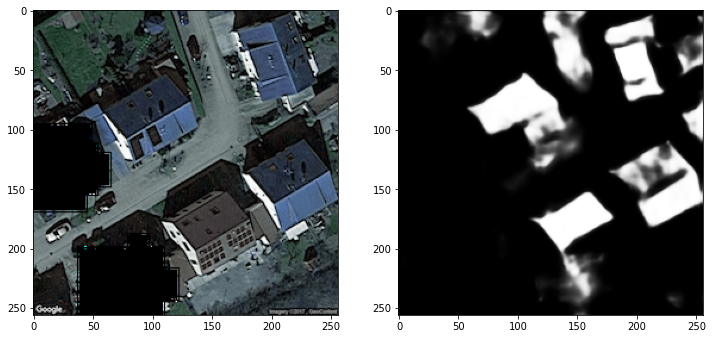

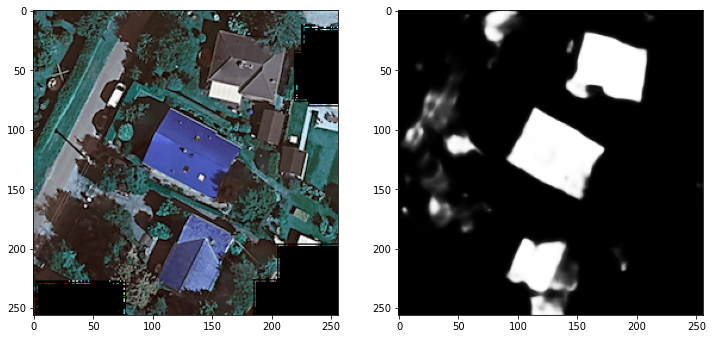

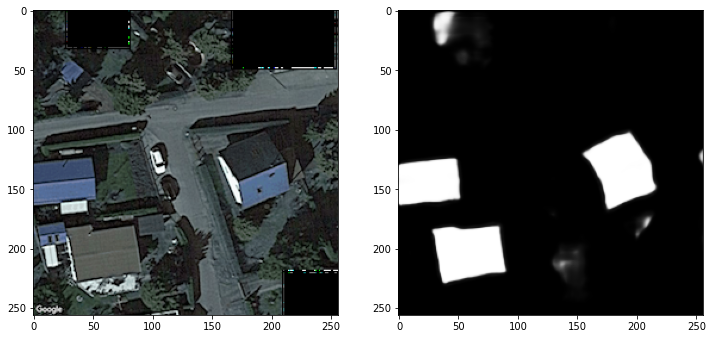

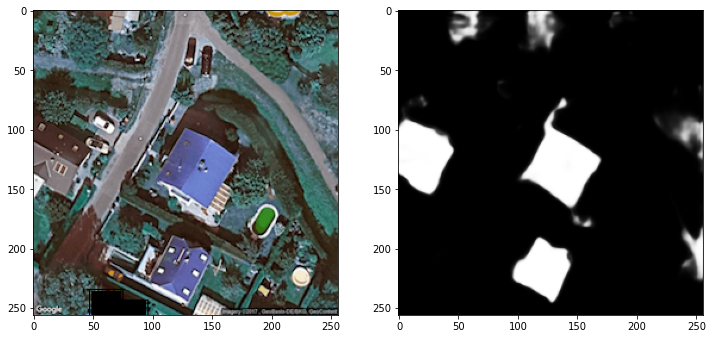

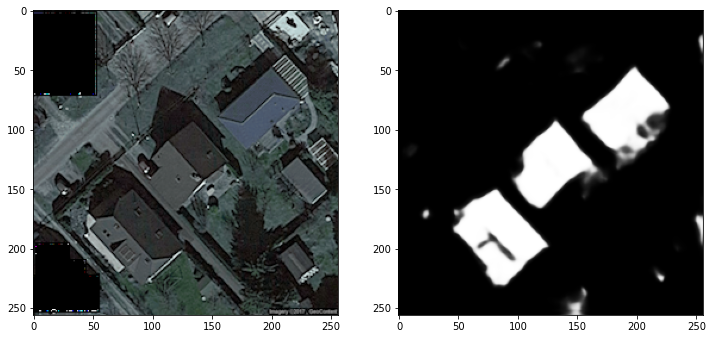

In [ ]:
# visualization of the prediction
plotting_pair(test_images, prediction_aug_pretrain)
  

## 5. Comparison 

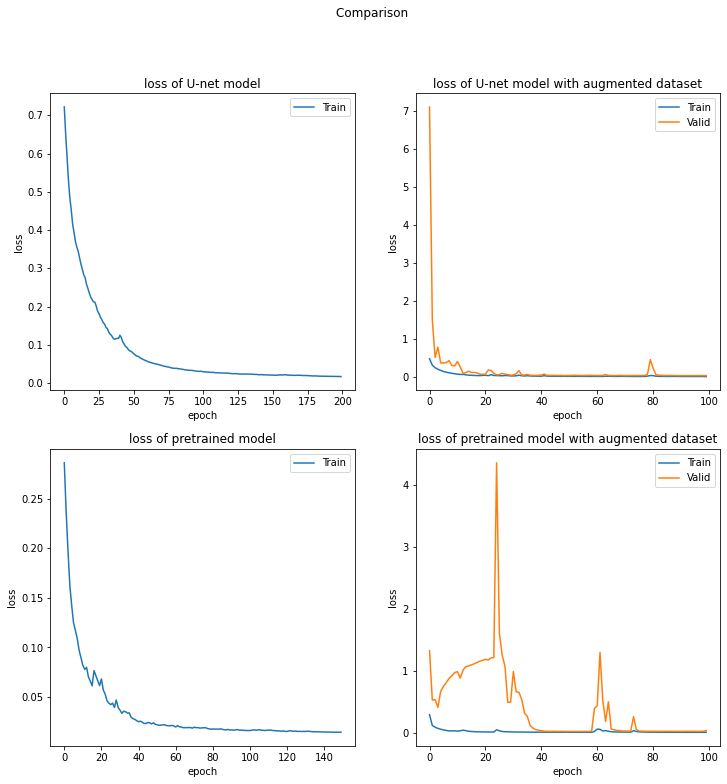

In [ ]:
fig, ax = plt.subplots(2,2, figsize=(12, 12))

fig.suptitle('Comparison ')

ax[0,0].plot(history.history['loss'], label = 'Train')
ax[0,0].set_title('loss of U-net model')
ax[0,0].set_ylabel('loss')
ax[0,0].set_xlabel('epoch')
ax[0,0].legend( loc='upper right')

ax[0,1].plot(aug_history.history['loss'], label = 'Train')
ax[0,1].plot(aug_history.history['val_loss'], label = 'Valid')
ax[0,1].set_title('loss of U-net model with augmented dataset')
ax[0,1].set_ylabel('loss')
ax[0,1].set_xlabel('epoch')
ax[0,1].legend( loc='upper right')

ax[1,0].plot(pretrained_history.history['loss'], label = 'Train')
ax[1,0].set_title('loss of pretrained model')
ax[1,0].set_ylabel('loss')
ax[1,0].set_xlabel('epoch')
ax[1,0].legend( loc='upper right')

ax[1,1].plot(aug_pretrain_history.history['loss'], label = 'Train')
ax[1,1].plot(aug_pretrain_history.history['val_loss'], label = 'Valid')
ax[1,1].set_title('loss of pretrained model with augmented dataset')
ax[1,1].set_ylabel('loss')
ax[1,1].set_xlabel('epoch')
ax[1,1].legend( loc='upper right')
#plt.legend( loc='upper right')
plt.show()